In [2]:
using Pkg
Pkg.activate("spectral")

  Activating project at `/data/gpfs/projects/punim0638/stephenz/qrot/notebooks/spectral`


In [19]:
using OptimalTransport
using Plots
using LinearAlgebra
using Distributions
using Random
using NearestNeighbors
using SparseArrays
using MultivariateStats
using SimpleWeightedGraphs
using GraphPlot
using PyCall
using Clustering
using Glob
using Serialization
using StatsPlots
using LaTeXStrings
using ProgressMeter

include("../src/util.jl")
Random.seed!(0)

TaskLocalRNG()

In [20]:
N = 250
σs = [0.3, 0.6, 1.0]
d = 250

labels = vcat([fill(i, N) for i = 1:3]...)
μs = hcat([vcat([sin(t), cos(t)], zeros(d-2)) for t in [0, 2π/3, -2π/3]]...)*1.5
X = hcat([Diagonal(σ*ones(d))*randn(d, N) .+ μ for (σ, μ) in zip(σs, eachcol(μs))]...);

pca_op = fit(PCA, X; maxoutdim = 3)
X_pca = (pca_op.proj' * X);

In [21]:
skcluster = pyimport("sklearn.cluster")
colordict = Dict(0 => colorant"red", 1 => colorant"green", 2 => colorant"blue");

In [22]:
ε_all = 10f0.^range(-2.0, 2.0; length = 50);

In [23]:
W_all_quad = [kernel_ot_quad(X, ε, potentials = false, diag_inf = true) for ε in ε_all];
W_all_quad_fat = [kernel_ot_quad(X, ε, potentials = false, diag_inf = false) for ε in ε_all];
W_all_ent = [kernel_ot_ent(X, ε, potentials = false, diag_inf = true) for ε in ε_all];
W_all_ent_fat = [kernel_ot_ent(X, ε, potentials = false, diag_inf = false) for ε in ε_all];
W_all_gauss = [norm_kernel(form_kernel(X, ε; k = 25), :sym) for ε in ε_all];

┌ Warning: OptimalTransport.SymmetricQuadraticOTNewton{Float64, Float64, Float64}(0.1, 0.5, 1.0e-5, 50) (100/100): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/quadratic_newton_symm.jl:230


In [24]:
function clust(W, k)
    clust_op = skcluster.SpectralClustering(n_clusters = k, affinity = "precomputed", n_jobs = 16)
    clust_op.fit_predict(Array(symm(W)));
end

clust (generic function with 1 method)

In [25]:
clusts_ent_all = [clust(w, 3) for w in W_all_ent]
clusts_quad_all = [clust(w, 3) for w in W_all_quad]
clusts_gauss_all = [clust(w, 3) for w in W_all_gauss]
clusts_quad_fat_all = [clust(w, 3) for w in W_all_quad_fat]
clusts_ent_fat_all = [clust(w, 3) for w in W_all_ent_fat]

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:392: UserWarning: Exited at iteration 84 with accuracies 
[1.90742876e-13 1.08551913e-05 1.22017401e-05 9.36131377e-06]
not reaching the requested tolerance 1.1175870895385742e-05.
Use iteration 84 instead with accuracy 
8.10456133431577e-06.

  _, diffusion_map = lobpcg(
/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:392: UserWarning: Exited postprocessing with accuracies 
[4.65566241e-14 1.08551990e-05 1.22017335e-05 9.36131340e-06]
not reaching the requested tolerance 1.1175870895385742e-05.
  _, diffusion_map = lobpcg(
/data/gpfs/projects/punim0638/stephenz/miniconda3/l

50-element Vector{Vector{Int32}}:
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 2, 2, 1, 1, 0, 1, 2, 1, 2  …  0, 1, 1, 1, 0, 0, 2, 1, 2, 1]
 [0, 2, 2, 0, 0, 2, 0, 1, 0, 1  …  2, 0, 0, 0, 2, 0, 0, 0, 0, 0]
 [2, 0, 1, 2, 2, 1, 2, 2, 0, 2  …  2, 0, 2, 2, 1, 0, 2, 2, 2, 2]
 [0, 2, 1, 0, 0, 1, 2, 0, 2, 0  …  2, 2, 0, 0, 1, 2, 0, 0, 0, 2]
 [1, 1, 1, 1, 1, 1, 1, 2, 1, 0  …  0, 1, 0, 2, 0, 0, 2, 2, 0, 1]
 [0, 0, 0, 0, 0, 0, 0, 1, 0, 1  …  2, 0, 2, 1, 2, 2, 1, 1, 2, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  1, 0, 0, 1, 0, 1, 0, 1, 1, 2]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  1, 0, 0, 2, 0, 1, 0, 2, 1, 1]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  2, 1, 1, 2, 1, 1, 2, 2, 1, 1]
 [2, 2, 2, 2, 2, 2, 2, 2, 2, 2  …  0, 2, 1, 2, 1, 1, 0, 0, 1, 0]
 ⋮
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  2, 2, 2, 1, 2, 2, 2, 2, 2, 2]
 [2, 2, 2, 2, 2, 2, 2, 2, 2, 2  …  0, 0, 0, 2, 0, 0, 

In [26]:
scores_quad_all = map(x -> mutualinfo(labels, x), clusts_quad_all) 
scores_quad_fat_all = map(x -> mutualinfo(labels, x), clusts_quad_fat_all) 
scores_ent_all = map(x -> mutualinfo(labels, x), clusts_ent_all) 
scores_ent_fat_all = map(x -> mutualinfo(labels, x), clusts_ent_fat_all) 
scores_gauss_all = map(x -> mutualinfo(labels, x), clusts_gauss_all);

┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148


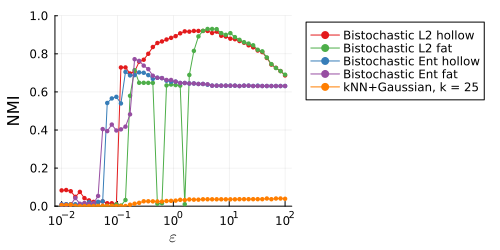

In [27]:
using LaTeXStrings
pal = palette(:Set1_9)
plt1=plot(ε_all, scores_quad_all, ylim = (0, 1), label = "Bistochastic L2 hollow", m = "o", markerstrokewidth = 0, color = pal[1], xscale = :log10, size = (500,250), legend = :outertopright, titlefontsize = 12, xlabel = L"ε", ylabel = "NMI", markersize = 2.5, margin = 2*Plots.mm)
plot!(ε_all, scores_quad_fat_all, ylim = (0, 1), label = "Bistochastic L2 fat", m = "o", markerstrokewidth = 0, color = pal[3], markersize = 2.5)
plot!(ε_all, scores_ent_all, ylim = (0, 1), label = "Bistochastic Ent hollow", m = "o", markerstrokewidth = 0, color = pal[2], markersize = 2.5)
plot!(ε_all, scores_ent_fat_all, ylim = (0, 1), label = "Bistochastic Ent fat", m = "o", markerstrokewidth = 0, color = pal[4], markersize = 2.5)
plot!(ε_all, scores_gauss_all, ylim = (0, 1), label = "kNN+Gaussian, k = 25", m = "o", markerstrokewidth = 0, color = pal[5], markersize = 2.5)
savefig("../figures/gmm_clustering_perf_hollow_vs_fat.svg")
savefig("../figures/gmm_clustering_perf_hollow_vs_fat.pdf")
plt1

┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148


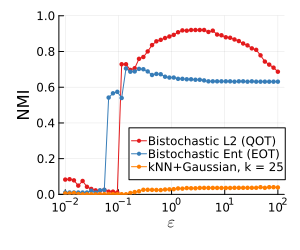

In [28]:
plt1=plot(ε_all, scores_quad_all, ylim = (0, 1), label = "Bistochastic L2 (QOT)", m = "o", markerstrokewidth = 0, color = pal[1], xscale = :log10, size = (300,250), legend = (0.4, 0.3), titlefontsize = 12, xlabel = L"ε", ylabel = "NMI", markersize = 2.5, margin = 2*Plots.mm)
plot!(ε_all, scores_ent_all, ylim = (0, 1), label = "Bistochastic Ent (EOT)", m = "o", markerstrokewidth = 0, color = pal[2], markersize = 2.5)
plot!(ε_all, scores_gauss_all, ylim = (0, 1), label = "kNN+Gaussian, k = 25", m = "o", markerstrokewidth = 0, color = pal[5], markersize = 2.5)
savefig("../figures/gmm_clustering_perf.svg")
savefig("../figures/gmm_clustering_perf.pdf")
plt1

In [29]:
i = argmax(scores_quad_all)
nodefillc = [colordict[x] for x in clusts_quad_all[i]]
W_thresh = copy(symm(W_all_quad[i]))
thresh = quantile(vec(W_thresh[W_thresh .> 0]), 0.5)
W_thresh[W_thresh .< thresh] .= 0
g = SimpleWeightedGraph(W_thresh)
gplot(g, X_pca[1, :], X_pca[2, :], nodefillc = nodefillc, 
    nodestrokec = [colorant"black" for _ in nodefillc], nodestrokelw = [0 for _ in nodefillc], 
    edgestrokec = colorant"lightgray")

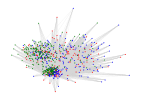

In [30]:
i = argmax(scores_gauss_all)
nodefillc = [colordict[x] for x in clusts_gauss_all[i]]
W_thresh = copy(symm(W_all_gauss[i]))
thresh = quantile(vec(W_thresh[W_thresh .> 0]), 0.5)
W_thresh[W_thresh .< thresh] .= 0
g = SimpleWeightedGraph(W_thresh)
gplot(g, X_pca[1, :], X_pca[2, :], nodefillc = nodefillc, 
    nodestrokec = [colorant"black" for _ in nodefillc], nodestrokelw = [0 for _ in nodefillc], 
    edgestrokec = colorant"lightgray")

In [32]:
# Investigate optimal clustering for QROT
W, u = kernel_ot_quad(X, ε_all[argmax(scores_quad_all)], potentials = true, diag_inf = true)

([0.0 0.006098869431442245 … 0.0 0.0; 0.006098869431442309 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.09636070610390288, 0.10493268526085651, 0.10609976692363945, 0.09203513477269605, 0.09315171976840167, 0.10488292113781306, 0.09939042768084033, 0.08816580867063985, 0.093654332758599, 0.08163510769052003  …  0.8956676609584785, 0.9638416891864859, 0.9559711162298439, 0.8767098185166131, 0.9688706147949142, 0.9895468454116028, 0.8506266969723513, 0.910804112396718, 0.9492237296908362, 0.9653645684553551])

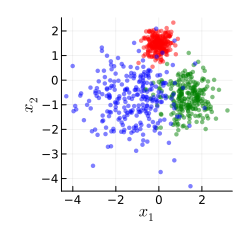

In [33]:
plt=scatter(X[1, :], X[2, :], markerstrokewidth = 0, alpha = 0.5, color = [colordict[x-1] for x in labels], markersize = 2.5, legend = nothing, xlabel = L"x_1", ylabel = L"x_2", size = (250, 250), margin = 2.5*Plots.mm)
savefig("../figures/gmm_true_clusters.svg")
plt

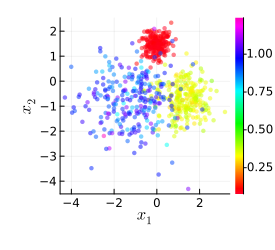

In [34]:
plt=scatter(X[1, :], X[2, :], markerstrokewidth = 0, alpha = 0.5, marker_z = u, markersize = 2.5, legend = nothing, xlabel = L"x_1", ylabel = L"x_2", size = (275, 250), color = :gist_rainbow, colorbar = true, margin = 2.5*Plots.mm)
savefig("../figures/gmm_dual_potentials.svg")
plt

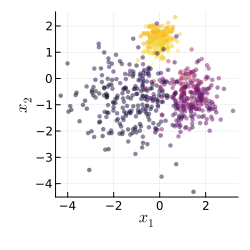

In [35]:
scatter(X[1, :], X[2, :], markerstrokewidth = 0, alpha = 0.5, marker_z = sum(W .> 0; dims = 2), markersize = 2.5, legend = nothing, xlabel = L"x_1", ylabel = L"x_2", size = (250, 250))

In [36]:
c = clust(W, 3);
mutualinfo(c, labels)

0.9202291608711184

In [37]:
# Effects of PCA
ε_quad = ε_all[argmax(scores_quad_all)]
ε_ent = ε_all[argmax(scores_ent_all)]
ε_knn = ε_all[argmax(scores_gauss_all)]
k = 3
ds = Int.(floor.(range(5, 250; length = 25)))
scores_knn = []
scores_quad = []
scores_ent = []

@showprogress for d in ds
    pca_op = fit(PCA, X; maxoutdim = d)
    X_pca = pca_op.proj' * X;
    W_quad = kernel_ot_quad(X_pca, ε_quad; diag_inf = true)
    W_ent = kernel_ot_ent(X_pca, ε_ent; diag_inf = true)
    W_knn = norm_kernel(form_kernel(X_pca, ε_knn; k = 25), :sym)
    push!(scores_knn, mutualinfo(labels, clust(W_knn, k)))
    push!(scores_quad, mutualinfo(labels, clust(W_quad, k)))
    push!(scores_ent, mutualinfo(labels, clust(W_ent, k)))
end

Progress:  12%|████▉                                    |  ETA: 0:00:21┌ Warning: OptimalTransport.SymmetricQuadraticOTNewton{Float64, Float64, Float64}(0.1, 0.5, 1.0e-5, 50) (100/100): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/quadratic_newton_symm.jl:230
Progress: 100%|█████████████████████████████████████████| Time: 0:00:47


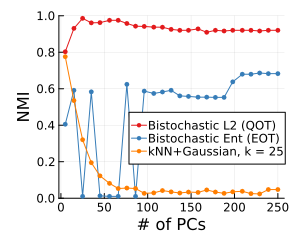

In [38]:
plt1=plot(ds, scores_quad, marker = :o, markerstrokewidth = 0, label = "Bistochastic L2 (QOT)", ylim = (0, 1), color = pal[1], markersize = 2.5, size = (300,250), legend = (0.4, 0.4), xlabel = "# of PCs", ylabel = "NMI", margin = 2*Plots.mm)
plot!(ds, scores_ent, marker = :o, markerstrokewidth = 0, label = "Bistochastic Ent (EOT)", color = pal[2], markersize = 2.5)
plot!(ds, scores_knn, marker = :o, markerstrokewidth = 0, label = "kNN+Gaussian, k = 25", color = pal[5], markersize = 2.5)
savefig("../figures/gmm_clustering_pca_perf.svg")
savefig("../figures/gmm_clustering_pca_perf.pdf")
plt1


In [39]:
pal = palette(:Set1_9)
outputs_all = [deserialize(f) for f in Glob.glob("../jobs/gaussian/[^0-9]*.out")]
scores_all = Dict()
for k in keys(outputs_all[1]["scores"])
    scores_all[k] = hcat([o["scores"][k] for o in outputs_all]...)'
end
y = cat(values(scores_all)...; dims = 3);
y = permutedims(y, (2, 1, 3));

┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148


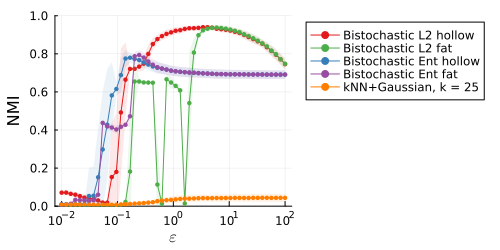

In [40]:
plt1=errorline(ε_all, scores_all["W_quad"], ylim = (0, 1), label = "Bistochastic L2 hollow", m = "o", markerstrokewidth = 0, color = pal[1], groupcolor = pal[1], xscale = :log10, size = (500,250), legend = :outertopright, titlefontsize = 12, xlabel = L"ε", ylabel = "NMI", markersize = 2.5, margin = 2*Plots.mm)
errorline!(ε_all, scores_all["W_quad_fat"], ylim = (0, 1), label = "Bistochastic L2 fat", m = "o", markerstrokewidth = 0, color = pal[3], groupcolor = pal[3], markersize = 2.5)
errorline!(ε_all, scores_all["W_ent"], ylim = (0, 1), label = "Bistochastic Ent hollow", m = "o", markerstrokewidth = 0, color = pal[2], groupcolor = pal[2], markersize = 2.5)
errorline!(ε_all, scores_all["W_ent_fat"], ylim = (0, 1), label = "Bistochastic Ent fat", m = "o", markerstrokewidth = 0, color = pal[4], groupcolor = pal[4], markersize = 2.5)
errorline!(ε_all, scores_all["W_gauss_25"], ylim = (0, 1), label = "kNN+Gaussian, k = 25", m = "o", markerstrokewidth = 0, color = pal[5], groupcolor = pal[5], markersize = 2.5)

In [42]:
# Try a different kernel
# K = form_kernel(X, 1.0)
# solver = OptimalTransport.build_solver(ones(size(X, 2)), (ones(size(K, 1)) * ones(size(K, 2))') - K, 1, OptimalTransport.SymmetricQuadraticOTNewton(); maxiter = 100)
# OptimalTransport.solve!(solver)
# W = OptimalTransport.plan(solver);
# sparse(W)
# 
# c = clust(W, 3);
# 
# nodefillc = [colordict[x] for x in c]
# g = SimpleWeightedGraph(W)
# gplot(g, X_pca[1, :], X_pca[2, :], nodefillc = nodefillc, 
#     nodestrokec = [colorant"black" for _ in nodefillc], nodestrokelw = [0 for _ in nodefillc], 
#     edgestrokec = colorant"lightgray")
# 
# u = solver.cache.u
# scatter(X[1, :], X[2, :], markerstrokewidth = 0, alpha = 0.5, marker_z = u, markersize = 2.5, legend = nothing, xlabel = L"x_1", ylabel = L"x_2", size = (275, 250), color = :gist_rainbow, colorbar = true, margin = 2.5*Plots.mm)
# 
# mutualinfo(labels, c)

In [43]:
# Low-dimensional case for illustrations' sake
Random.seed!(0)
d_lowdim = 10
N_lowdim = 250
labels = vcat([fill(i, N_lowdim) for i = 1:3]...)
μs_lowdim = hcat([vcat([sin(t), cos(t)], zeros(d_lowdim-2)) for t in [0, 2π/3, -2π/3]]...)*1.5
X_lowdim = hcat([Diagonal(σ*ones(d_lowdim))*randn(d_lowdim, N_lowdim) .+ μ for (σ, μ) in zip(σs, eachcol(μs_lowdim))]...);
X_lowdim_pca = fit(PCA, X_lowdim; maxoutdim = 3).proj' * X_lowdim

3×750 Matrix{Float64}:
 -1.41773   -1.28847   -0.692042  …   3.07187    1.25845   -0.636841
 -1.09052   -1.06723   -0.851891     -0.977365  -0.381469  -0.691503
  0.549381   0.326204   0.312665     -1.79578   -1.6102     0.516083

In [44]:
W_lowdim_all_quad = [kernel_ot_quad(X_lowdim, ε, potentials = false, diag_inf = true) for ε in ε_all];
W_lowdim_all_ent = [kernel_ot_ent(X_lowdim, ε, potentials = false, diag_inf = true) for ε in ε_all];
W_lowdim_all_gauss = [norm_kernel(form_kernel(X_lowdim, ε; k = 25), :sym) for ε in ε_all];

┌ Warning: Symmetric Sinkhorn algorithm (5000/5000): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/entropic/sinkhorn_solve.jl:103
┌ Warning: Symmetric Sinkhorn algorithm (5000/5000): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/entropic/sinkhorn_solve.jl:103
┌ Warning: Symmetric Sinkhorn algorithm (5000/5000): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/entropic/sinkhorn_solve.jl:103
┌ Warning: Symmetric Sinkhorn algorithm (5000/5000): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/entropic/sinkhorn_solve.jl:103
┌ Warning: Symmetric Sinkhorn algorithm (5000/5000): not converged
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/tlanw/src/entropic/sinkhorn_solve.jl:103


In [45]:
clusts_lowdim_ent_all = [clust(w, 3) for w in W_lowdim_all_ent];
clusts_lowdim_quad_all = [clust(w, 3) for w in W_lowdim_all_quad];
clusts_lowdim_gauss_all = [clust(w, 3) for w in W_lowdim_all_gauss];

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:392: UserWarning: Exited at iteration 100 with accuracies 
[2.42266822e-14 1.52370214e-05 1.90101310e-05 7.95264151e-06]
not reaching the requested tolerance 1.1175870895385742e-05.
Use iteratio

In [46]:
scores_lowdim_quad_all = map(x -> mutualinfo(labels, x), clusts_lowdim_quad_all) 
scores_lowdim_ent_all = map(x -> mutualinfo(labels, x), clusts_lowdim_ent_all) 
scores_lowdim_gauss_all = map(x -> mutualinfo(labels, x), clusts_lowdim_gauss_all);

┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148
┌ Warning: Skipped marker arg o.
└ @ Plots ~/.julia/packages/Plots/rz1WP/src/args.jl:1148


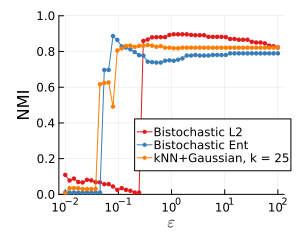

In [47]:
using LaTeXStrings
pal = palette(:Set1_9)
plt1=plot(ε_all, scores_lowdim_quad_all, ylim = (0, 1), label = "Bistochastic L2", m = "o", markerstrokewidth = 0, color = pal[1], xscale = :log10, size = (300,250), legend = (0.425, 0.35), titlefontsize = 12, xlabel = L"ε", ylabel = "NMI", markersize = 2.5, margin = 2*Plots.mm)
plot!(ε_all, scores_lowdim_ent_all, ylim = (0, 1), label = "Bistochastic Ent", m = "o", markerstrokewidth = 0, color = pal[2], markersize = 2.5)
plot!(ε_all, scores_lowdim_gauss_all, ylim = (0, 1), label = "kNN+Gaussian, k = 25", m = "o", markerstrokewidth = 0, color = pal[5], markersize = 2.5)
plt1

In [48]:
W_quad = W_lowdim_all_quad[argmax(scores_lowdim_quad_all)] # kernel_ot_quad(X_lowdim, 1.0, potentials = false, diag_inf = true);
W_ent = W_lowdim_all_ent[argmax(scores_lowdim_ent_all)] # kernel_ot_ent(X_lowdim, 0.1, potentials = false, diag_inf = true);
W_knn = W_lowdim_all_gauss[argmax(scores_lowdim_gauss_all)]; # norm_kernel(form_kernel(X_lowdim, 1; k=10), :sym);

In [49]:
import Cairo, Fontconfig

In [50]:
using Graphs
using Compose
W_thresh = copy(symm(W_ent))
thresh = quantile(vec(W_thresh), 0)
W_thresh[W_thresh .< thresh] .= 0
g = SimpleWeightedGraph(W_thresh)
nodefillc = [colordict[x-1] for x in labels]
plt=gplot(g, X_lowdim_pca[1, :], X_lowdim_pca[2, :], nodefillc = nodefillc, 
    nodestrokec = [colorant"black" for _ in nodefillc], nodestrokelw = [0 for _ in nodefillc], 
    edgestrokec = RGBA(0.1, 0.1, 0.1, 1), edgelinewidth = [e.weight for e in edges(g)], EDGELINEWIDTH = 0.5
    )
draw(PNG("../figures/gmm_ent.png", 16cm, 16cm, dpi = 300), plt)

In [51]:
W_thresh = copy(symm(W_quad))
thresh = quantile(vec(W_thresh), 0)
W_thresh[W_thresh .< thresh] .= 0
g = SimpleWeightedGraph(W_thresh)
nodefillc = [colordict[x-1] for x in labels]
plt=gplot(g, X_lowdim_pca[1, :], X_lowdim_pca[2, :], nodefillc = nodefillc, 
    nodestrokec = [colorant"black" for _ in nodefillc], nodestrokelw = [0 for _ in nodefillc], 
    edgestrokec = RGBA(0.1, 0.1, 0.1, 1), edgelinewidth = [e.weight for e in edges(g)], EDGELINEWIDTH = 0.5
    )
draw(PNG("../figures/gmm_quad.png", 16cm, 16cm, dpi = 300), plt)

In [52]:
W_thresh = copy(symm(W_knn))
thresh = quantile(vec(W_thresh), 0)
W_thresh[W_thresh .< thresh] .= 0
g = SimpleWeightedGraph(W_thresh)
nodefillc = [colordict[x-1] for x in labels]
plt=gplot(g, X_lowdim_pca[1, :], X_lowdim_pca[2, :], nodefillc = nodefillc, 
    nodestrokec = [colorant"black" for _ in nodefillc], nodestrokelw = [0 for _ in nodefillc], 
    edgestrokec = RGBA(0.1, 0.1, 0.1, 1), edgelinewidth = [e.weight for e in edges(g)], EDGELINEWIDTH = 0.5
    )
draw(PNG("../figures/gmm_knn.png", 16cm, 16cm, dpi = 300), plt)

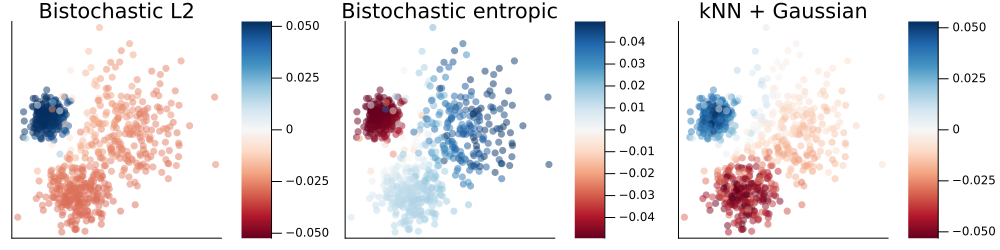

In [53]:
plts_all = []
for (w, t) in zip([W_quad, W_ent, W_knn], ["Bistochastic L2", "Bistochastic entropic", "kNN + Gaussian"])
    v = eigen(I - w).vectors[:, 2]
    lim =quantile(abs.(v), 0.9)
    push!(plts_all, scatter(X_lowdim_pca[1, :], -X_lowdim_pca[2, :], marker_z = v, 
                    color = :RdBu, markerstrokewidth = 0, legend = nothing, title = t, colorbar = true, alpha = 0.5, clim = (-lim, lim), axis = nothing))
end
plt=plot(plts_all...; layout = (1, 3), size = (1000, 250))
savefig("../figures/gmm_fiedler_vector.pdf")
plt

In [54]:
# eigengap
[eigen(I - w).values[2] for w in [W_quad, W_ent, W_knn]]

3-element Vector{Float64}:
 0.015382002290715728
 0.04992144676463727
 0.025552812789702787